<!-- doc:auto -->
# Pipeline chuẩn bị dữ liệu — Phân vùng bệnh lá chè

Notebook này xây dựng dữ liệu huấn luyện **phân vùng (segmentation)** cho mô hình `UMobileViT` theo các bước:

1. **Kiểm kê** các dataset nguồn (đếm ảnh/lớp).
2. **Tách lá** khỏi nền bằng kỹ thuật thị giác cổ điển (2 pipeline cho nền đen / nền trắng).
3. **Trích xuất** từng lá thành object RGBA (nền trong suốt) làm thư viện.
4. **Cân bằng lớp** bằng trọng số căn bậc hai.
5. **Sinh ảnh tổng hợp** bằng cách ghép ngẫu nhiên các lá lên nền đa dạng, có làm mềm biên.
6. **Xuất** annotation định dạng **COCO** (polygon/RLE).
7. **Trực quan hóa & thống kê** để kiểm tra chất lượng.

> 🎯 *Mục tiêu chất lượng dữ liệu*: thu hẹp khoảng cách giữa ảnh tổng hợp và ảnh thực bằng nền ngẫu nhiên + ghép lá tự nhiên, đồng thời giữ nhãn sắc nét.

In [133]:
import os
import random
from pathlib import Path
from functools import partial
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import math
import json
from collections import defaultdict
from concurrent.futures import ProcessPoolExecutor, as_completed
from functools import partial
from typing import List, Tuple, Dict, Any
from tqdm import tqdm  
from PIL import Image, ImageOps, ImageEnhance
try:
    from pycocotools import mask as cocomask
except ImportError:
    print("pycocotools chưa được cài, sẽ dùng polygon thay vì RLE")
    cocomask = None


In [134]:
# import kagglehub

# # Download latest version
# path = kagglehub.dataset_download("harjindersinghdibru/tealeafnet")

# print("Path to dataset files:", path)

# path = kagglehub.dataset_download("bmshahriaalam/tealeafbd-tea-leaf-disease-detection")

# print("Path to dataset files:", path)

<!-- doc:auto -->
## 1. Cấu hình chung

Đặt seed để tái lập, khai báo danh sách dataset nguồn, kích thước ảnh đích, các tham số morphology, và **bảng ánh xạ lớp thống nhất** (`UNIFIED_CLASSES`) gộp nhãn từ nhiều nguồn về một không gian lớp chung.

In [ ]:
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

DATASETS = [
    "5000_tea_leaf_with_blackbg_geotagged",
    "teaLeafBD"
]

TARGET_SIZE = (224, 224)
BLACK_BG_THRESHOLD = 15
MORPH_KERNEL = (7, 7)
BLUR_KERNEL = (5, 5)

SAMPLE = 10000

UNIFIED_CLASSES = {
    "healthy_leaf": 0,
    "brown_blight": 1,
    "red_spider_mite": 2,
    "red_rust": 3,
    "gray_blight": 4,
    "helopeltis": 5,
    "green_mirid_bug": 6,
    "tea_algal_leaf_spot": 7,
}

In [136]:
print("CUDA available:", torch.cuda.is_available())
print("Current directory files:", os.listdir("./"))

CUDA available: True
Current directory files: ['5000_tea_leaf_with_blackbg_geotagged', 'COCO', 'data.ipynb', 'README_DATA.md', 'teaLeafBD']


<!-- doc:auto -->
## 2. Kiểm kê dataset (audit)

Liệt kê các lớp và đếm số ảnh mỗi lớp trong từng dataset nguồn để hiểu phân bố và phát hiện mất cân bằng.

In [137]:
def get_class_names(dataset_root):
    dataset_root = Path(dataset_root)
    return sorted([d.name for d in dataset_root.iterdir() if d.is_dir()])


def get_class_files(dataset_root, class_name):
    class_dir = Path(dataset_root) / class_name
    return sorted([f.name for f in class_dir.iterdir() if f.is_file()])


def build_dataset_index(dataset_root):
    dataset_root = Path(dataset_root)
    classes = get_class_names(dataset_root)
    return {cls: get_class_files(dataset_root, cls) for cls in classes}

In [138]:
def audit_dataset(dataset_root):
    dataset_root = Path(dataset_root)
    class_dict = build_dataset_index(dataset_root)

    print(f"\nDataset: {dataset_root.name}")
    print(f"Number of classes: {len(class_dict)}")

    for cls, files in class_dict.items():
        print(f"  - {cls}: {len(files)} images")

    return class_dict

In [139]:
folder_1 = DATASETS[0]
cls_dict_1 = audit_dataset(folder_1)


Dataset: 5000_tea_leaf_with_blackbg_geotagged
Number of classes: 4
  - BB: 1250 images
  - GL: 1250 images
  - RR: 1250 images
  - RSM: 1250 images


<!-- doc:auto -->
## 3. Xem mẫu ảnh thô

Hiển thị một vài ảnh ngẫu nhiên mỗi lớp để nắm đặc điểm dữ liệu (màu nền, độ sáng, nhiễu) trước khi thiết kế pipeline tách nền.

In [140]:
def show_raw_samples(dataset_root, class_dict, n_samples=4, seed=42):
    random.seed(seed)
    classes = list(class_dict.keys())
    n_classes = len(classes)

    plt.figure(figsize=(n_samples * 4, n_classes * 3))

    for row_idx, cls_name in enumerate(classes):
        class_dir = Path(dataset_root) / cls_name
        files = class_dict[cls_name]

        if not files:
            continue

        chosen = random.sample(files, k=min(n_samples, len(files)))

        for col_idx, filename in enumerate(chosen):
            img_path = class_dir / filename
            img_bgr = cv2.imread(str(img_path))
            if img_bgr is None:
                continue

            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

            ax = plt.subplot(n_classes, n_samples, row_idx * n_samples + col_idx + 1)
            ax.imshow(img_rgb)
            ax.set_title(f"{cls_name}\n{img_rgb.shape[1]}x{img_rgb.shape[0]}")
            ax.axis("off")

    plt.tight_layout()
    plt.show()

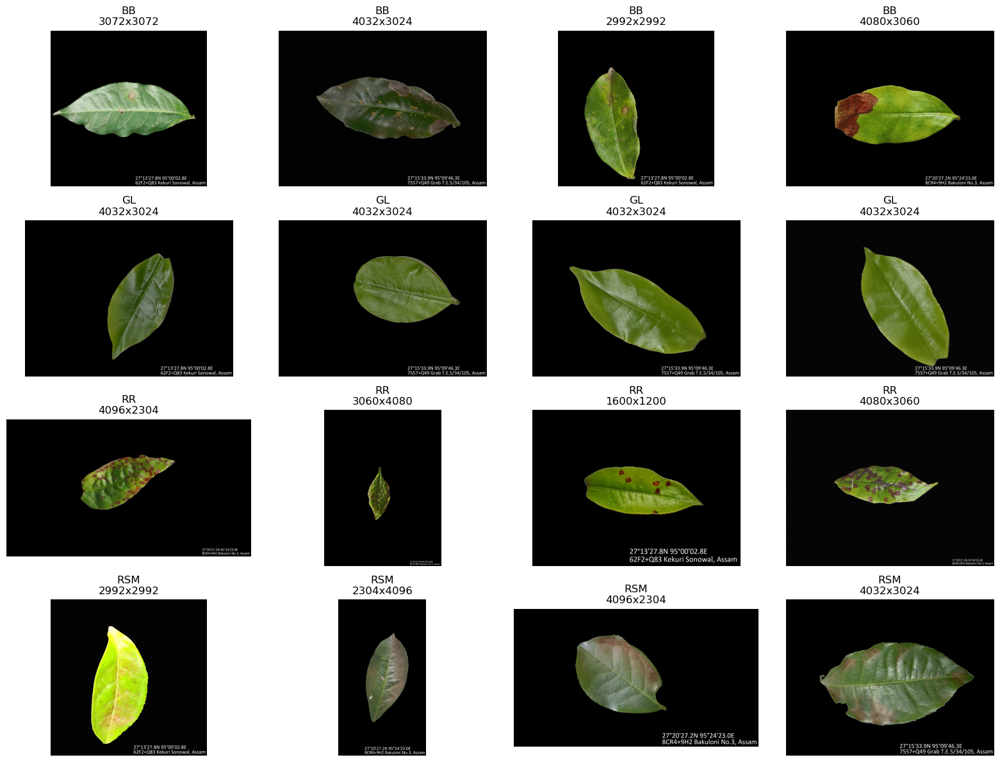

In [141]:
show_raw_samples(folder_1, cls_dict_1, n_samples=4, seed=1)

In [142]:
folder_2 = DATASETS[1]
cls_dict_2 = audit_dataset(folder_2)


Dataset: teaLeafBD
Number of classes: 7
  - 1. Tea algal leaf spot: 418 images
  - 2. Brown Blight: 506 images
  - 3. Gray Blight: 1013 images
  - 4. Helopeltis: 607 images
  - 5. Red spider: 515 images
  - 6. Green mirid bug: 1282 images
  - 7. Healthy leaf: 935 images


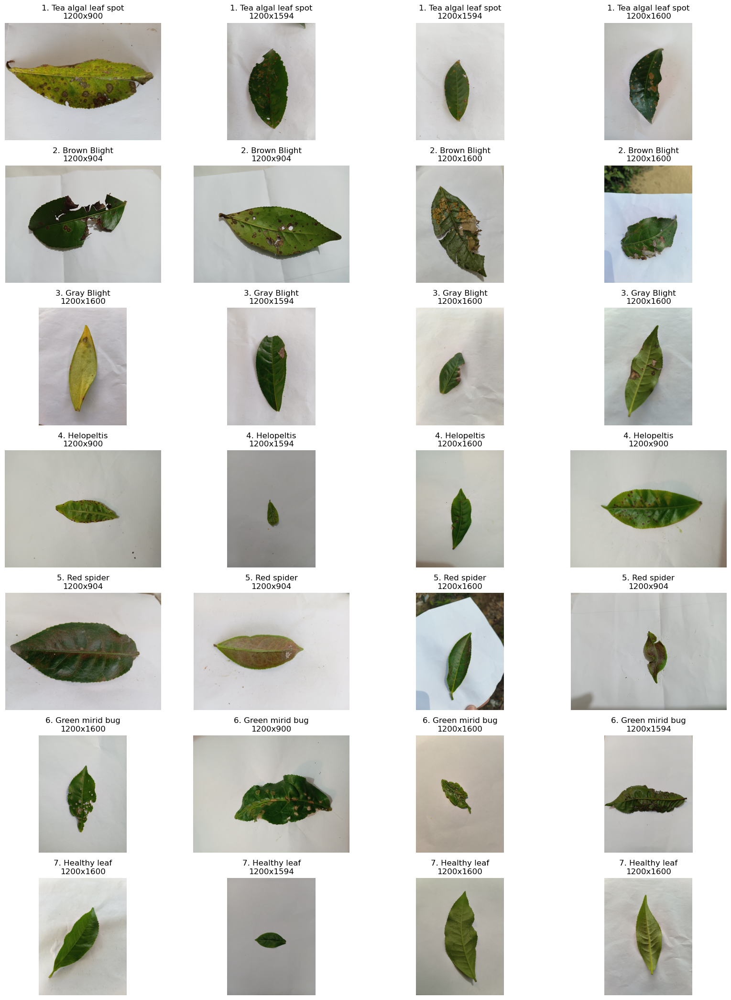

In [143]:
show_raw_samples(folder_2, cls_dict_2, n_samples=4, seed=42)

<!-- doc:auto -->
## 4. Tách lá khỏi nền (segmentation cổ điển)

### 4.1. Dataset 1 (nền đen)

Resize sớm → blur nhẹ → ngưỡng theo độ sáng → morphology → giữ contour/connected-component lớn nhất. Nhanh và phù hợp với nền tối đồng nhất.

In [144]:
def segment_tea_leaf(
    image_path,
    target_size=(224, 224),
    threshold=BLACK_BG_THRESHOLD,
    blur_ksize=(3, 3),
    morph_ksize=(5, 5),
    min_area_ratio=0.01,
):
    """
    Phiên bản nhanh cho dataset 1:
    - resize sớm
    - blur nhỏ hơn
    - morphology gọn hơn
    - giữ largest contour hoặc connected component lớn nhất
    """
    img_bgr = cv2.imread(str(image_path))
    if img_bgr is None:
        return None

    if target_size is not None:
        img_bgr = cv2.resize(img_bgr, target_size, interpolation=cv2.INTER_AREA)

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    blurred = cv2.GaussianBlur(gray, blur_ksize, 0)
    _, mask_raw = cv2.threshold(blurred, threshold, 255, cv2.THRESH_BINARY)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, morph_ksize)
    mask_closed = cv2.morphologyEx(mask_raw, cv2.MORPH_CLOSE, kernel)
    mask_closed = cv2.morphologyEx(mask_closed, cv2.MORPH_OPEN, kernel)

    # Chọn component tốt nhất thay vì chỉ contour, ổn định hơn khi có nhiễu nhỏ
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask_closed, connectivity=8)

    generated_mask = np.zeros_like(mask_closed)
    if num_labels > 1:
        h, w = mask_closed.shape[:2]
        min_area = max(50, int(h * w * min_area_ratio))

        best_label = None
        best_area = 0

        for label in range(1, num_labels):
            area = stats[label, cv2.CC_STAT_AREA]
            if area >= min_area and area > best_area:
                best_area = area
                best_label = label

        if best_label is not None:
            generated_mask[labels == best_label] = 255

    extracted = cv2.bitwise_and(img_rgb, img_rgb, mask=generated_mask)

    return {
        "img_rgb": img_rgb,
        "gray": gray,
        "blurred": blurred,
        "mask_raw": mask_raw,
        "mask_closed": mask_closed,
        "generated_mask": generated_mask,
        "extracted": extracted,
    }

In [145]:
def create_mask_for_tea_leaf(
    image_path,
    target_size=(224, 224),
    threshold=BLACK_BG_THRESHOLD,
    blur_ksize=(3, 3),
    morph_ksize=(5, 5),
    min_area_ratio=0.01,
):
    result = segment_tea_leaf(
        image_path=image_path,
        target_size=target_size,
        threshold=threshold,
        blur_ksize=blur_ksize,
        morph_ksize=morph_ksize,
        min_area_ratio=min_area_ratio,
    )
    if result is None:
        return None
    return result["generated_mask"]

In [146]:
def plot_segmentation_result(
    image_path,
    threshold=BLACK_BG_THRESHOLD,
    blur_ksize=BLUR_KERNEL,
    morph_ksize=MORPH_KERNEL,
    title=None
):
    result = segment_tea_leaf(
        image_path=image_path,
        threshold=threshold,
        blur_ksize=blur_ksize,
        morph_ksize=morph_ksize
    )

    if result is None:
        print(f"[WARN] Cannot read image: {image_path}")
        return

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    if title is None:
        title = Path(image_path).name
    fig.suptitle(title, fontsize=14)

    axes[0, 0].imshow(result["img_rgb"])
    axes[0, 0].set_title("Original RGB")

    axes[0, 1].imshow(result["gray"], cmap="gray")
    axes[0, 1].set_title("Gray")

    axes[0, 2].imshow(result["blurred"], cmap="gray")
    axes[0, 2].set_title("Blurred")

    axes[0, 3].imshow(result["mask_raw"], cmap="gray")
    axes[0, 3].set_title(f"Raw Mask (t={threshold})")

    axes[1, 0].imshow(result["mask_closed"], cmap="gray")
    axes[1, 0].set_title("After Morphology")

    axes[1, 1].imshow(result["generated_mask"], cmap="gray")
    axes[1, 1].set_title("Generated Mask")

    axes[1, 2].imshow(result["extracted"])
    axes[1, 2].set_title("Extracted Leaf")

    overlay = result["img_rgb"].copy()
    overlay[result["generated_mask"] == 0] = 0
    axes[1, 3].imshow(overlay)
    axes[1, 3].set_title("Overlay")

    for ax in axes.ravel():
        ax.axis("off")

    plt.tight_layout()
    plt.show()

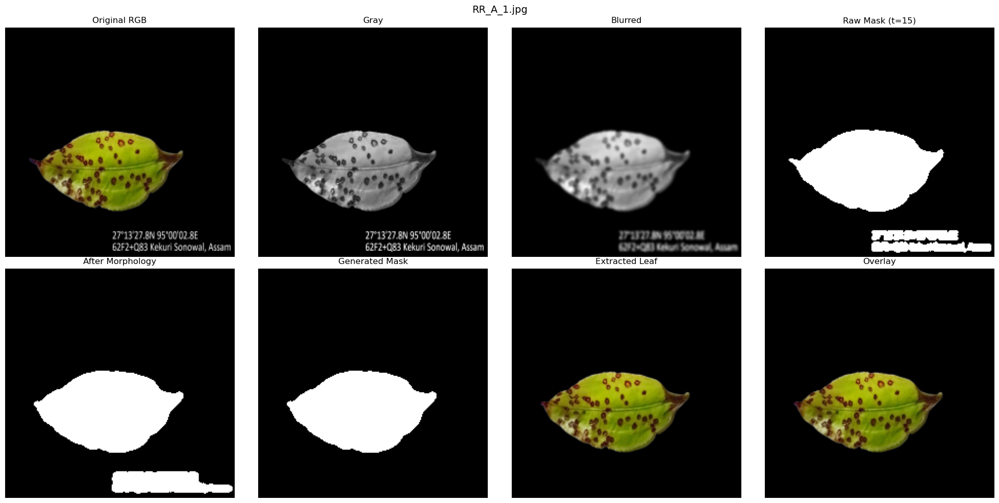

In [147]:
sample_cls = "RR"
sample_file = cls_dict_1[sample_cls][0]
sample_path = Path(folder_1) / sample_cls / sample_file

plot_segmentation_result(sample_path, threshold=15)

<!-- doc:auto -->
## 4.2. Tách lá — Dataset 2 (nền trắng, có nhiễu)

Pipeline cho nền sáng: Otsu nghịch đảo + morphology open/close + *center prior* (ưu tiên vùng gần tâm) + chọn connected component theo điểm số (diện tích + gần tâm). Trả về đầy đủ bước trung gian để debug.

In [148]:
def segment_tea_leaf_white_bg(
    image_path,
    target_size=None,
    blur_ksize=(5, 5),
    morph_open_ksize=(5, 5),
    morph_close_ksize=(9, 9),
    center_ellipse_ratio=0.92,
    min_area_ratio=0.005,
    border_margin=8,
):
    """
    Pipeline cho nền trắng có nhiễu, có center prior:
    - gray
    - blur
    - Otsu INV
    - morphology open/close
    - center ellipse prior
    - connected components score theo area + proximity to center
    - extracted leaf

    Trả về đầy đủ bước trung gian để debug.
    """
    img_bgr = cv2.imread(str(image_path))
    if img_bgr is None:
        return None

    if target_size is not None:
        img_bgr = cv2.resize(img_bgr, target_size)

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, blur_ksize, 0)

    # 1) Otsu inverse threshold
    _, mask_raw = cv2.threshold(
        blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
    )

    # 2) Morphology
    kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, morph_open_ksize)
    kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, morph_close_ksize)

    mask_opened = cv2.morphologyEx(mask_raw, cv2.MORPH_OPEN, kernel_open)
    mask_closed = cv2.morphologyEx(mask_opened, cv2.MORPH_CLOSE, kernel_close)

    # 3) Center prior: ellipse mask ở giữa ảnh
    h, w = mask_closed.shape[:2]
    center_prior = np.zeros((h, w), dtype=np.uint8)
    axes = (int(w * center_ellipse_ratio / 2), int(h * center_ellipse_ratio / 2))
    cv2.ellipse(center_prior, (w // 2, h // 2), axes, 0, 0, 360, 255, -1)

    # 4) Loại các vùng dính biên ảnh
    border_clean = mask_closed.copy()
    m = border_margin
    border_clean[:m, :] = 0
    border_clean[-m:, :] = 0
    border_clean[:, :m] = 0
    border_clean[:, -m:] = 0

    # 5) Giao với center prior để cắt vùng rác lớn ngoài trung tâm
    mask_centered = cv2.bitwise_and(border_clean, center_prior)

    # Nếu giao quá mạnh làm mất lá thì fallback về mask_closed
    if np.count_nonzero(mask_centered) < max(50, int(np.count_nonzero(mask_closed) * 0.2)):
        mask_centered = mask_closed.copy()

    # 6) Chọn connected component tốt nhất: lớn + gần tâm
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
        mask_centered, connectivity=8
    )

    generated_mask = np.zeros_like(mask_centered)
    if num_labels > 1:
        center_pt = np.array([w / 2.0, h / 2.0], dtype=np.float32)
        min_area = max(50, int(h * w * min_area_ratio))

        best_label = None
        best_score = -1.0

        for label in range(1, num_labels):
            area = stats[label, cv2.CC_STAT_AREA]
            if area < min_area:
                continue

            cx, cy = centroids[label]
            dist = np.linalg.norm(np.array([cx, cy], dtype=np.float32) - center_pt)

            # area lớn thì tốt, càng gần tâm càng tốt
            score = area / (1.0 + dist)

            if score > best_score:
                best_score = score
                best_label = label

        if best_label is not None:
            generated_mask[labels == best_label] = 255
        else:
            # fallback: contour lớn nhất
            contours, _ = cv2.findContours(
                mask_centered, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
            )
            if contours:
                largest_contour = max(contours, key=cv2.contourArea)
                cv2.drawContours(generated_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    else:
        # fallback: contour lớn nhất
        contours, _ = cv2.findContours(
            mask_centered, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
        )
        if contours:
            largest_contour = max(contours, key=cv2.contourArea)
            cv2.drawContours(generated_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)

    extracted = cv2.bitwise_and(img_rgb, img_rgb, mask=generated_mask)

    return {
        "img_rgb": img_rgb,
        "gray": gray,
        "blurred": blurred,
        "mask_raw": mask_raw,
        "mask_opened": mask_opened,
        "mask_closed": mask_closed,
        "center_prior": center_prior,
        "mask_centered": mask_centered,
        "generated_mask": generated_mask,
        "extracted": extracted,
    }

In [149]:
def create_mask_for_tea_leaf_white_bg(
    image_path,
    target_size=None,
    blur_ksize=(5, 5),
    morph_open_ksize=(5, 5),
    morph_close_ksize=(9, 9),
    center_ellipse_ratio=0.92,
    min_area_ratio=0.005,
    border_margin=8,
):
    result = segment_tea_leaf_white_bg(
        image_path=image_path,
        target_size=target_size,
        blur_ksize=blur_ksize,
        morph_open_ksize=morph_open_ksize,
        morph_close_ksize=morph_close_ksize,
        center_ellipse_ratio=center_ellipse_ratio,
        min_area_ratio=min_area_ratio,
        border_margin=border_margin,
    )

    if result is None:
        return None

    return result["generated_mask"]

In [150]:
def plot_segmentation_result_white_bg(
    image_path,
    target_size=None,
    blur_ksize=(5, 5),
    morph_open_ksize=(5, 5),
    morph_close_ksize=(9, 9),
    center_ellipse_ratio=0.92,
    min_area_ratio=0.005,
    border_margin=8,
    title=None
):
    result = segment_tea_leaf_white_bg(
        image_path=image_path,
        target_size=target_size,
        blur_ksize=blur_ksize,
        morph_open_ksize=morph_open_ksize,
        morph_close_ksize=morph_close_ksize,
        center_ellipse_ratio=center_ellipse_ratio,
        min_area_ratio=min_area_ratio,
        border_margin=border_margin,
    )

    if result is None:
        print(f"[WARN] Cannot read image: {image_path}")
        return

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    if title is None:
        title = Path(image_path).name
    fig.suptitle(title, fontsize=14)

    axes[0, 0].imshow(result["img_rgb"])
    axes[0, 0].set_title("Original RGB")

    axes[0, 1].imshow(result["gray"], cmap="gray")
    axes[0, 1].set_title("Gray")

    axes[0, 2].imshow(result["mask_raw"], cmap="gray")
    axes[0, 2].set_title("Otsu INV")

    axes[0, 3].imshow(result["mask_closed"], cmap="gray")
    axes[0, 3].set_title("After Morphology")

    axes[1, 0].imshow(result["center_prior"], cmap="gray")
    axes[1, 0].set_title("Center Prior")

    axes[1, 1].imshow(result["mask_centered"], cmap="gray")
    axes[1, 1].set_title("Centered Mask")

    axes[1, 2].imshow(result["generated_mask"], cmap="gray")
    axes[1, 2].set_title("Generated Mask")

    axes[1, 3].imshow(result["extracted"])
    axes[1, 3].set_title("Extracted Leaf")

    for ax in axes.ravel():
        ax.axis("off")

    plt.tight_layout()
    plt.show()

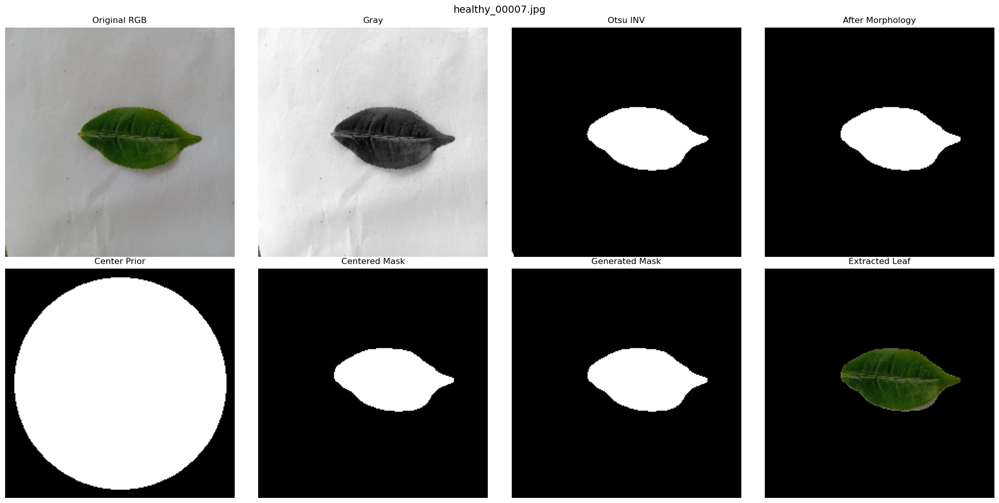

In [151]:
sample_cls_2 = list(cls_dict_2.keys())[6]
sample_file_2 = cls_dict_2[sample_cls_2][6]
sample_path_2 = Path(folder_2) / sample_cls_2 / sample_file_2

plot_segmentation_result_white_bg(sample_path_2, target_size=(224, 224))

<!-- doc:auto -->
## 4.3. So sánh trước/sau khi tách nền

Hiển thị song song ảnh gốc và ảnh đã tách lá để đánh giá định tính chất lượng segmentation trên cả hai dataset.

In [152]:
def show_before_after_samples(
    dataset_root,
    class_dict,
    segment_fn,
    n_samples=16,
    samples_per_row=4,
    seed=42,
    target_size=None,
    title=None
):
    """
    Hiển thị n_samples ảnh ngẫu nhiên:
    - cột trái: ảnh gốc
    - cột phải: ảnh sau tách nền

    segment_fn phải trả về dict có khóa:
    - "img_rgb"
    - "extracted"
    """
    random.seed(seed)

    # Gom tất cả file từ mọi class
    all_items = []
    for cls, files in class_dict.items():
        for f in files:
            all_items.append((cls, f))

    if not all_items:
        print(f"[WARN] Dataset {dataset_root} không có ảnh.")
        return

    n_samples = min(n_samples, len(all_items))
    chosen_items = random.sample(all_items, k=n_samples)

    n_rows = math.ceil(n_samples / samples_per_row)
    n_cols = samples_per_row * 2  # mỗi sample chiếm 2 cột: before / after

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(samples_per_row * 6, n_rows * 4))
    if n_rows == 1:
        axes = np.expand_dims(axes, axis=0)

    if title is None:
        title = f"{Path(dataset_root).name} | Before / After background removal"
    fig.suptitle(title, fontsize=16)

    for idx, (cls_name, filename) in enumerate(chosen_items):
        row = idx // samples_per_row
        col = idx % samples_per_row
        col_before = col * 2
        col_after = col * 2 + 1

        img_path = Path(dataset_root) / cls_name / filename

        if target_size is None:
            result = segment_fn(img_path)
        else:
            result = segment_fn(img_path, target_size=target_size)

        ax_before = axes[row, col_before]
        ax_after = axes[row, col_after]

        if result is None:
            ax_before.set_title(f"Before\n{cls_name}")
            ax_before.axis("off")
            ax_after.set_title("After\n[read failed]")
            ax_after.axis("off")
            continue

        ax_before.imshow(result["img_rgb"])
        ax_before.set_title(f"Before\n{cls_name}")
        ax_before.axis("off")

        ax_after.imshow(result["extracted"])
        ax_after.set_title("After")
        ax_after.axis("off")
        
    total_slots = n_rows * samples_per_row
    for idx in range(n_samples, total_slots):
        row = idx // samples_per_row
        col = idx % samples_per_row
        axes[row, col * 2].axis("off")
        axes[row, col * 2 + 1].axis("off")

    plt.tight_layout()
    plt.show()

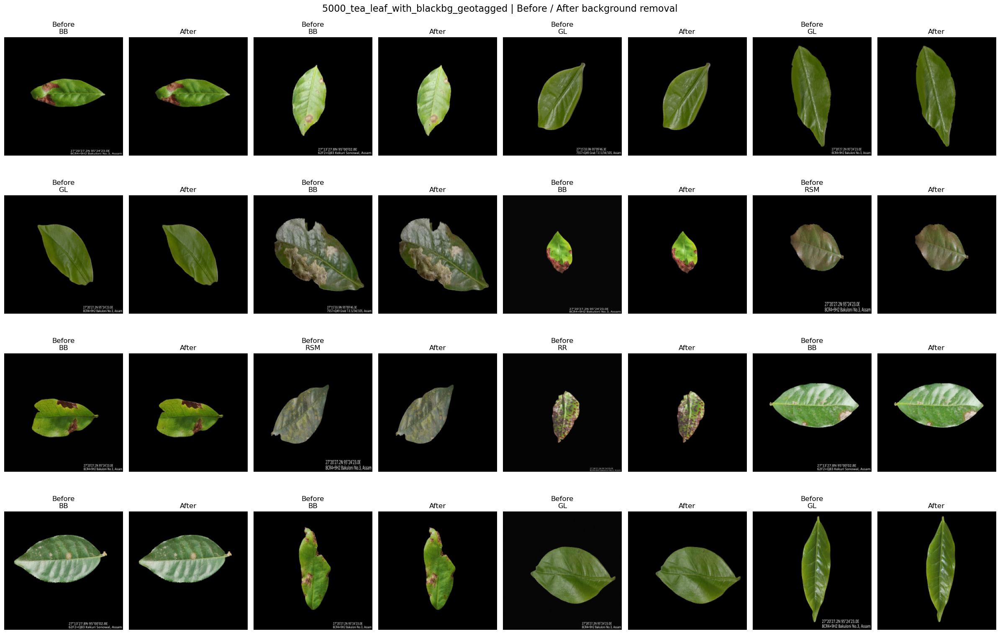

In [153]:
show_before_after_samples(
    folder_1,
    cls_dict_1,
    segment_fn=segment_tea_leaf,
    n_samples=16,
    samples_per_row=4,
    seed=42
)

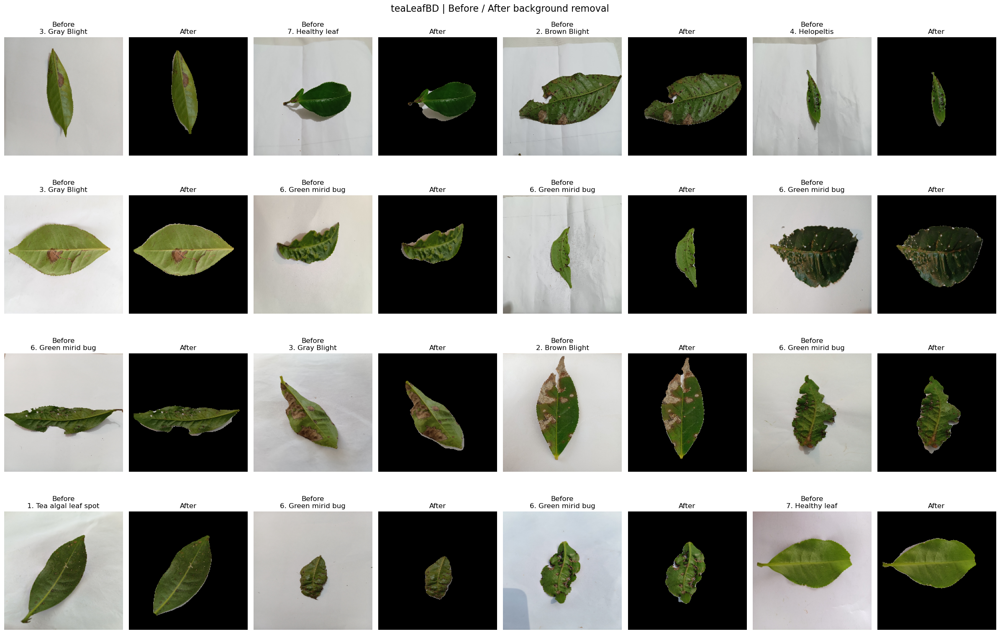

In [154]:
show_before_after_samples(
    folder_2,
    cls_dict_2,
    segment_fn=segment_tea_leaf_white_bg,
    n_samples=16,
    samples_per_row=4,
    seed=1,
    target_size=(224, 224)
)

<!-- doc:auto -->
## 5. Cân bằng lớp (class balancing)

Dùng trọng số `count ** alpha` (alpha=0.5, tức căn bậc hai) để giảm thiên lệch giữa lớp nhiều mẫu và lớp ít mẫu khi lấy mẫu sinh ảnh, tránh để mô hình học lệch về lớp phổ biến.

In [155]:
CLASS_COUNTS = {
    "healthy_leaf": 2185,
    "brown_blight": 1756,
    "red_spider_mite": 1765,
    "red_rust": 1250,
    "gray_blight": 1013,
    "helopeltis": 607,
    "green_mirid_bug": 1282,
    "tea_algal_leaf_spot": 418,
}

In [156]:
alpha = 0.5

weights = {
    cls: count ** alpha
    for cls, count in CLASS_COUNTS.items()
}

total = sum(weights.values())

CLASS_PROBS = {
    cls: weight / total
    for cls, weight in weights.items()
}

In [157]:
print(CLASS_PROBS)

{'healthy_leaf': 0.16770286006155377, 'brown_blight': 0.15034085106177067, 'red_spider_mite': 0.15072562850311697, 'red_rust': 0.12684394922837114, 'gray_blight': 0.11418773837072224, 'helopeltis': 0.08839121307324933, 'green_mirid_bug': 0.12845729163702366, 'tea_algal_leaf_spot': 0.07335046806419236}


<!-- doc:auto -->
## 6. Trích xuất thư viện object lá (RGBA)

Áp dụng segmentation cho toàn bộ ảnh, lưu mỗi lá thành PNG RGBA (nền trong suốt) song song bằng `ThreadPoolExecutor`. Lọc bỏ object có mask quá nhỏ/rỗng. Đây là *nguyên liệu* để ghép ảnh synthetic ở bước sau.

In [158]:
EXTRACTED_OBJECTS_DIR = Path("./extracted_leaf_objects")
EXTRACTED_OBJECTS_DIR.mkdir(exist_ok=True)

def extract_leaf_object(image_path, seg_func, min_mask_pixels=200, **kwargs):
    """
    Gọi segmentation và trả về ảnh RGBA (nền trong suốt).
    Có filter object rỗng / mask quá nhỏ.
    """

    result = seg_func(image_path, **kwargs)

    if result is None:
        return None

    img_rgb = result["img_rgb"]
    mask = result["generated_mask"]

    if mask is None:
        return None

    # đảm bảo uint8
    mask = mask.astype(np.uint8)

    # loại mask rỗng
    nonzero = np.count_nonzero(mask)

    if nonzero < min_mask_pixels:
        return None

    h, w = mask.shape

    rgba = np.zeros((h, w, 4), dtype=np.uint8)
    rgba[:, :, :3] = img_rgb
    rgba[:, :, 3] = mask

    return rgba
def process_single_image(img_path, std_class_name, class_id, seg_func, seg_kwargs, out_dir):
    """Xử lý một ảnh: extract, lưu PNG, trả về metadata"""
    try:
        rgba = extract_leaf_object(
                img_path,
                seg_func,
                min_mask_pixels=100,
                **seg_kwargs
            )
        if rgba is None:
            return None
        base_name = f"{std_class_name}_{Path(img_path).stem}.png"
        out_path = out_dir / base_name
        if out_path.exists():
            out_path = out_dir / f"{std_class_name}_{Path(img_path).stem}_{random.randint(1000,9999)}.png"
        Image.fromarray(rgba).save(out_path)
        return {
            "class_name": std_class_name,
            "class_id": class_id,
            "file_path": out_path,
            "original_size": (rgba.shape[1], rgba.shape[0])
        }
    except Exception as e:
        print(f"Lỗi xử lý {img_path}: {e}")
        return None

def build_leaf_object_library_parallel(dataset_root, class_dict, seg_func, class_mapping, seg_kwargs={}, max_workers=8):
    """Xây dựng thư viện object bằng ThreadPoolExecutor (tránh pickle)"""
    from concurrent.futures import ThreadPoolExecutor, as_completed
    tasks = []
    out_dir = EXTRACTED_OBJECTS_DIR
    for raw_class_name, file_list in class_dict.items():
        std_class_name = class_mapping.get(raw_class_name, raw_class_name)
        if std_class_name not in UNIFIED_CLASSES:
            print(f"Bỏ qua class '{raw_class_name}' -> '{std_class_name}' (không có trong UNIFIED_CLASSES)")
            continue
        class_id = UNIFIED_CLASSES[std_class_name]
        class_dir = Path(dataset_root) / raw_class_name
        for fname in file_list:
            img_path = class_dir / fname
            tasks.append((img_path, std_class_name, class_id))
    print(f"Dataset {Path(dataset_root).name}: {len(tasks)} ảnh cần xử lý")
    library = []
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        future_to_img = {executor.submit(process_single_image, img_path, std_class_name, class_id, seg_func, seg_kwargs, out_dir): img_path
                         for img_path, std_class_name, class_id in tasks}
        for future in tqdm(as_completed(future_to_img), total=len(tasks), desc="Extracting objects"):
            result = future.result()
            if result is not None:
                library.append(result)
    return library

MAPPING_DATASET1 = {
    "BB": "brown_blight",
    "GL": "healthy_leaf",
    "RR": "red_rust",
    "RSM": "red_spider_mite"
}

MAPPING_DATASET2 = {
    "1. Tea algal leaf spot": "tea_algal_leaf_spot",
    "2. Brown Blight": "brown_blight",
    "3. Gray Blight": "gray_blight",
    "4. Helopeltis": "helopeltis",
    "5. Red spider": "red_spider_mite",
    "6. Green mirid bug": "green_mirid_bug",
    "7. Healthy leaf": "healthy_leaf"
}

print("Bắt đầu extract từ dataset 1 (nền đen)...")
lib1 = build_leaf_object_library_parallel(
    folder_1, cls_dict_1,
    seg_func=segment_tea_leaf,
    class_mapping=MAPPING_DATASET1,
    seg_kwargs={"threshold": BLACK_BG_THRESHOLD, "target_size": (224,224)},
    max_workers=8          
)

print("\nBắt đầu extract từ dataset 2 (nền trắng)...")
lib2 = build_leaf_object_library_parallel(
    folder_2, cls_dict_2,
    seg_func=segment_tea_leaf_white_bg,
    class_mapping=MAPPING_DATASET2,
    seg_kwargs={"target_size": (224,224)},
    max_workers=8
)

leaf_library = lib1 + lib2
print(f"\nTổng số object lá đã extract: {len(leaf_library)}")

from collections import Counter
class_counts = Counter(obj["class_name"] for obj in leaf_library)
print("\nPhân bố class trong object library:")
for cls, cnt in sorted(class_counts.items()):
    print(f"   {cls}: {cnt} objects")

Bắt đầu extract từ dataset 1 (nền đen)...
Dataset 5000_tea_leaf_with_blackbg_geotagged: 5000 ảnh cần xử lý


Extracting objects: 100%|██████████| 5000/5000 [00:33<00:00, 149.65it/s]



Bắt đầu extract từ dataset 2 (nền trắng)...
Dataset teaLeafBD: 5276 ảnh cần xử lý


Extracting objects: 100%|██████████| 5276/5276 [00:10<00:00, 497.44it/s]


Tổng số object lá đã extract: 10276

Phân bố class trong object library:
   brown_blight: 1756 objects
   gray_blight: 1013 objects
   green_mirid_bug: 1282 objects
   healthy_leaf: 2185 objects
   helopeltis: 607 objects
   red_rust: 1250 objects
   red_spider_mite: 1765 objects
   tea_algal_leaf_spot: 418 objects


<!-- doc:auto -->
## 7. Sinh ảnh tổng hợp (synthetic composition)

Ghép ngẫu nhiên các object lá đã tách lên một canvas để tạo ảnh huấn luyện kèm annotation ở **định dạng COCO** (polygon/RLE).

**Cải thiện chất lượng dữ liệu** (xem cell helper kế bên):
- **Nền ngẫu nhiên** thay cho nền đen thuần → giảm *domain-gap* với ảnh thực.
- **Làm mềm biên (alpha feathering)** khi dán lá → loại bỏ viền cứng răng cưa, ảnh tự nhiên hơn.
- Đặt lá theo *cụm* (cluster) với kiểm soát chồng lấp, mật độ theo phân phối Poisson.
- Mask annotation vẫn giữ **nhị phân sắc nét** nên nhãn không bị nhiễu.

In [159]:
def sample_leaf_count(max_count=30, lam=5.0):
    while True:
        n = np.random.poisson(lam)
        if 0 <= n <= max_count:
            return n

In [160]:
OUTPUT_DIR = Path("./coco_leaf")
OUTPUT_DIR.mkdir(exist_ok=True)
TRAIN_IMG_DIR = OUTPUT_DIR / "train_images"
VAL_IMG_DIR = OUTPUT_DIR / "val_images"
TRAIN_IMG_DIR.mkdir(exist_ok=True)
VAL_IMG_DIR.mkdir(exist_ok=True)

In [161]:
IMAGE_SIZE = 320
MAX_OBJECTS = 50
LAMBDA_POISSON = 80.0        
MAX_PLACEMENT_ATTEMPTS = 150
MIN_OBJ_WIDTH = 50
MAX_OBJ_WIDTH = 300
TRAIN_RATIO = 0.8

UNIFIED_CLASSES = {
    "healthy_leaf": 0, "brown_blight": 1, "red_spider_mite": 2,
    "red_rust": 3, "gray_blight": 4, "helopeltis": 5,
    "green_mirid_bug": 6, "tea_algal_leaf_spot": 7,
}

In [162]:
CLASS_NAMES = {v: k for k, v in UNIFIED_CLASSES.items()}
print(CLASS_NAMES)

{0: 'healthy_leaf', 1: 'brown_blight', 2: 'red_spider_mite', 3: 'red_rust', 4: 'gray_blight', 5: 'helopeltis', 6: 'green_mirid_bug', 7: 'tea_algal_leaf_spot'}


In [163]:
def load_leaf_library(lib_metadata, min_alpha_pixels=200):
    """
    lib_metadata: list of dicts with keys "class_name", "class_id", "file_path"
    Trả về list of (img_path, class_id)
    """
    library = []

    for item in lib_metadata:

        path = item["file_path"]

        try:
            rgba = np.array(Image.open(path).convert("RGBA"))
            alpha = rgba[:, :, 3]

            if np.count_nonzero(alpha) < min_alpha_pixels:
                continue

            library.append((path, item["class_id"]))

        except Exception as e:
            print(f"Lỗi load object {path}: {e}")

    print(f"Loaded valid objects: {len(library)}")

    return library

In [164]:
def augment_object(pil_img, mask_raw):

    rgb_img = pil_img.convert("RGB")
    mask = Image.fromarray((mask_raw * 255).astype(np.uint8))

    # flip
    if random.random() < 0.5:
        rgb_img = ImageOps.mirror(rgb_img)
        mask = ImageOps.mirror(mask)

    if random.random() < 0.5:
        rgb_img = ImageOps.flip(rgb_img)
        mask = ImageOps.flip(mask)

    # rotate
    angle = random.uniform(-30, 30)

    rgb_img = rgb_img.rotate(
        angle,
        resample=Image.BICUBIC,
        expand=True
    )

    mask = mask.rotate(
        angle,
        resample=Image.NEAREST,
        expand=True
    )

    # resize
    w, h = rgb_img.size

    new_w = random.randint(MIN_OBJ_WIDTH, MAX_OBJ_WIDTH)

    scale = new_w / w
    new_h = max(8, int(h * scale))

    rgb_img = rgb_img.resize((new_w, new_h), Image.BICUBIC)
    mask = mask.resize((new_w, new_h), Image.NEAREST)

    # color jitter
    enhancers = [
        (ImageEnhance.Brightness, random.uniform(0.7, 1.3)),
        (ImageEnhance.Contrast, random.uniform(0.7, 1.3)),
        (ImageEnhance.Color, random.uniform(0.7, 1.3)),
    ]

    for enhancer_cls, factor in enhancers:
        rgb_img = enhancer_cls(rgb_img).enhance(factor)

    rgb = np.array(rgb_img)

    mask = np.array(mask)
    mask = (mask > 128).astype(np.uint8)

    # filter mask rỗng
    if np.count_nonzero(mask) < 50:
        return None, None

    return rgb, mask

In [ ]:
# === [CẢI THIỆN CHẤT LƯỢNG DỮ LIỆU] Nền ngẫu nhiên + làm mềm biên khi ghép lá ===
# Giảm domain-gap giữa ảnh synthetic và ảnh thực:
#  - make_random_background: thay nền đen thuần bằng nền màu/gradient/vân nhiễu đa dạng.
#  - feather_alpha: làm mềm (anti-alias) rìa mask để lá hòa vào nền, hết viền cứng.

def make_random_background(size, rng=None):
    """Sinh nền HxWx3 (uint8) đa dạng: màu trơn / gradient / vân nhiễu mờ / gần tối."""
    rng = rng if rng is not None else np.random
    H = W = size
    style = rng.randint(0, 4)
    if style == 0:                       # màu trơn ngả tông đất/lá
        base = rng.randint(30, 210, size=3).astype(np.float32)
        bg = np.ones((H, W, 3), np.float32) * base
    elif style == 1:                     # gradient giữa 2 màu
        c1 = rng.randint(20, 200, size=3).astype(np.float32)
        c2 = rng.randint(20, 200, size=3).astype(np.float32)
        t = np.linspace(0, 1, W, dtype=np.float32)[None, :, None]
        bg = (c1[None, None, :] * (1 - t) + c2[None, None, :] * t) * np.ones((H, 1, 1), np.float32)
    elif style == 2:                     # vân nhiễu mờ (đất/vải/nền mờ)
        base = rng.randint(30, 200, size=3).astype(np.float32)
        noise = rng.randn(max(1, H // 8), max(1, W // 8), 3).astype(np.float32)
        noise = cv2.resize(noise, (W, H), interpolation=cv2.INTER_CUBIC)
        bg = base[None, None, :] + noise * rng.uniform(15, 45)
    else:                                # gần tối (giữ một phần phân bố nền tối gốc)
        bg = np.ones((H, W, 3), np.float32) * rng.randint(0, 35)
    bg += rng.randn(H, W, 3).astype(np.float32) * rng.uniform(2, 8)   # hạt nhiễu cảm biến
    return np.clip(bg, 0, 255).astype(np.uint8)


def feather_alpha(binary_mask, blur_ksize=3):
    """Mask nhị phân -> alpha mềm [0,1] để ghép lá không bị viền răng cưa."""
    m = (binary_mask.astype(np.uint8) * 255)
    k = max(1, blur_ksize | 1)           # đảm bảo kernel lẻ
    soft = cv2.GaussianBlur(m, (k, k), 0).astype(np.float32) / 255.0
    return np.clip(soft, 0.0, 1.0)


In [165]:
def create_synthetic_image(library, class_probs=None):
    """
    Sinh một ảnh synthetic với mật độ dày hơn và cho phép overlap có kiểm soát.

    Giữ nguyên interface cũ:
        return canvas, annotations

    - library: list[(file_path, class_id)]
    - class_probs: list xác suất chọn class, len = số class
    """
    canvas = make_random_background(IMAGE_SIZE)  # [CẢI THIỆN] nền đa dạng thay vì đen thuần
    global_mask = np.zeros((IMAGE_SIZE, IMAGE_SIZE), dtype=np.uint8)
    annotations = []

    def _build_library_by_class(lib):
        d = defaultdict(list)
        for path, cid in lib:
            d[cid].append(path)
        return d

    def _clip_int(v, lo, hi):
        return max(lo, min(int(v), hi))

    def _sample_cluster_center():
        margin = 40
        cx = random.randint(margin, IMAGE_SIZE - margin)
        cy = random.randint(margin, IMAGE_SIZE - margin)
        return cx, cy

    def _sample_position_for_object(w_obj, h_obj, cluster_center=None):
        """
        Nếu có cluster_center thì sample gần tâm cụm.
        Nếu không thì sample đều như cũ.
        """
        if cluster_center is None:
            x = random.randint(0, max(0, IMAGE_SIZE - w_obj))
            y = random.randint(0, max(0, IMAGE_SIZE - h_obj))
            return x, y

        cx, cy = cluster_center
        spread_x = max(10, IMAGE_SIZE // 8)
        spread_y = max(10, IMAGE_SIZE // 8)

        x = int(np.random.normal(cx - w_obj // 2, spread_x))
        y = int(np.random.normal(cy - h_obj // 2, spread_y))

        x = _clip_int(x, 0, max(0, IMAGE_SIZE - w_obj))
        y = _clip_int(y, 0, max(0, IMAGE_SIZE - h_obj))
        return x, y

    library_by_class = _build_library_by_class(library)
    class_ids_available = [cid for cid in library_by_class.keys() if len(library_by_class[cid]) > 0]

    if len(class_ids_available) == 0:
        return canvas, annotations

    n_objects = sample_leaf_count(MAX_OBJECTS, LAMBDA_POISSON)
    if n_objects == 0:
        return canvas, annotations

    n_clusters = random.randint(2, 5)
    cluster_centers = [_sample_cluster_center() for _ in range(n_clusters)]


        # colored mask
    # Xác suất class
    if class_probs is not None:
        class_ids = list(range(len(UNIFIED_CLASSES)))
        probs = class_probs
    else:
        class_ids = list(range(len(UNIFIED_CLASSES)))
        probs = None

    for _ in range(n_objects):
        # Chọn class
        if probs is not None:
            chosen_class = int(np.random.choice(class_ids, p=probs))
        else:
            chosen_class = int(np.random.choice(class_ids))

        candidates = library_by_class.get(chosen_class, [])
        if not candidates:
            continue

        path = random.choice(candidates)
        cid = chosen_class

        # Load ảnh
        try:
            pil_img = Image.open(path).convert("RGBA")
        except Exception as e:
            print(f"Lỗi mở {path}: {e}")
            continue

        rgba = np.array(pil_img)
        alpha = rgba[:, :, 3]
        if alpha.max() == 0:
            continue

        mask_raw = (alpha > 128).astype(np.uint8)

        # Augment
        aug_rgb, aug_mask = augment_object(pil_img, mask_raw)
        if aug_rgb is None or aug_mask is None:
            continue

        h_obj, w_obj = aug_mask.shape
        if h_obj >= IMAGE_SIZE or w_obj >= IMAGE_SIZE:
            continue

        if np.count_nonzero(aug_mask) < 50:
            continue

        # Tạo mask collision nhỏ hơn mask thật để cho phép sát nhau hơn
        # nhưng vẫn tránh dính hoàn toàn
        collision_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        collision_mask = cv2.erode(aug_mask.astype(np.uint8), collision_kernel, iterations=1)

        if np.count_nonzero(collision_mask) < 20:
            collision_mask = aug_mask.astype(np.uint8)

        best_x = None
        best_y = None

        # Thử đặt gần các cluster center trước, sau đó fallback random
        candidate_centers = cluster_centers[:]
        random.shuffle(candidate_centers)

        # Tăng cơ hội đặt dày nhưng vẫn kiểm soát overlap
        max_overlap_ratio = 0.15
        if w_obj > 140 or h_obj > 140:
            max_overlap_ratio = 0.08

        # Thử theo các điểm gần cụm
        for attempt in range(MAX_PLACEMENT_ATTEMPTS):
            if attempt < len(candidate_centers):
                x, y = _sample_position_for_object(w_obj, h_obj, candidate_centers[attempt])
            else:
                x, y = _sample_position_for_object(w_obj, h_obj, None)

            roi = global_mask[y:y + h_obj, x:x + w_obj]

            # Tính overlap ratio trên collision mask
            overlap = np.sum(roi * collision_mask)
            obj_area = np.sum(collision_mask)
            overlap_ratio = overlap / (obj_area + 1e-6)

            if overlap_ratio <= max_overlap_ratio:
                best_x, best_y = x, y
                break

        # Nếu không tìm được vị trí phù hợp thì bỏ qua object này
        if best_x is None:
            continue

        # Vẽ object lên canvas: overwrite theo mask thật
        roi_canvas = canvas[best_y:best_y + h_obj, best_x:best_x + w_obj]
        # [CẢI THIỆN] alpha mềm để ghép lá tự nhiên, tránh viền cứng (nhãn vẫn dùng aug_mask nhị phân)
        mask_f = feather_alpha(aug_mask, blur_ksize=3)[..., None]

        blended = roi_canvas * (1.0 - mask_f) + aug_rgb.astype(np.float32) * mask_f
        canvas[best_y:best_y + h_obj, best_x:best_x + w_obj] = blended.astype(np.uint8)

        # Cập nhật global occupancy bằng mask thật
        global_mask[best_y:best_y + h_obj, best_x:best_x + w_obj] = np.maximum(
            global_mask[best_y:best_y + h_obj, best_x:best_x + w_obj],
            aug_mask.astype(np.uint8)
        )

        # Lưu annotation mask full-image
        full_mask = np.zeros((IMAGE_SIZE, IMAGE_SIZE), dtype=np.uint8)
        full_mask[best_y:best_y + h_obj, best_x:best_x + w_obj] = aug_mask.astype(np.uint8)

        annotations.append({
            "mask": full_mask,
            "category_id": cid
        })

    return canvas, annotations

In [166]:
def mask_to_polygon(mask):
    """Chuyển mask nhị phân thành list polygon (COCO format)."""
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    polygons = []
    for cnt in contours:
        if len(cnt) < 6:  # cần ít nhất 3 điểm
            continue
        polygons.append(cnt.flatten().tolist())
    return polygons

def mask_to_rle(mask):
    """Dùng pycocotools để encode RLE."""
    rle = cocomask.encode(np.asfortranarray(mask.astype(np.uint8)))
    rle['counts'] = rle['counts'].decode('utf-8')  # chuyển bytes -> string để JSON serializable
    return rle

def create_coco_annotations(image_id, annotations, use_rle=True):
    """
    Tạo list COCO annotation dicts từ mask annotations.
    """
    coco_anns = []
    for idx, ann in enumerate(annotations):
        mask = ann["mask"]
        cat_id = ann["category_id"]

        # Bounding box từ mask
        rows, cols = np.where(mask)
        if len(rows) == 0:
            continue
        x_min, x_max = np.min(cols), np.max(cols)
        y_min, y_max = np.min(rows), np.max(rows)
        w = x_max - x_min + 1
        h = y_max - y_min + 1
        bbox = [int(x_min), int(y_min), int(w), int(h)]
        area = float(np.sum(mask))

        if use_rle and cocomask is not None:
            seg = mask_to_rle(mask)
        else:
            seg = mask_to_polygon(mask)
            if not seg:
                continue

        coco_anns.append({
            "id": len(coco_anns) + 1,  # sẽ cập nhật global id sau
            "image_id": image_id,
            "category_id": cat_id,
            "segmentation": seg,
            "bbox": bbox,
            "area": area,
            "iscrowd": 0
        })
    return coco_anns

In [167]:
def generate_dataset(library, num_images, class_probs=None, use_rle=True):
    """
    Sinh `num_images` ảnh và annotations.
    Trả về images list, annotations list cho COCO.
    """
    images = []
    annotations = []
    ann_id = 1

    for img_id in tqdm(range(1, num_images + 1), desc="Generating images"):
        canvas, anns = create_synthetic_image(library, class_probs)
        # Quyết định tập train/val
        if random.random() < TRAIN_RATIO:
            split_dir = TRAIN_IMG_DIR
        else:
            split_dir = VAL_IMG_DIR

        file_name = f"synth_{img_id:06d}.jpg"
        file_path = split_dir / file_name
        cv2.imwrite(str(file_path), cv2.cvtColor(canvas, cv2.COLOR_RGB2BGR))

        images.append({
            "id": img_id,
            "file_name": str(file_path.relative_to(OUTPUT_DIR)),
            "width": IMAGE_SIZE,
            "height": IMAGE_SIZE
        })

        if anns:
            coco_anns = create_coco_annotations(img_id, anns, use_rle)
            for ann in coco_anns:
                ann["id"] = ann_id
                ann_id += 1
                annotations.append(ann)

    return images, annotations

In [168]:
alpha = 0.5
weights = {cls: count**alpha for cls, count in CLASS_COUNTS.items()}
total = sum(weights.values())
class_probs = [weights[CLASS_NAMES[i]] / total for i in range(len(UNIFIED_CLASSES))]

Loaded valid objects: 10276


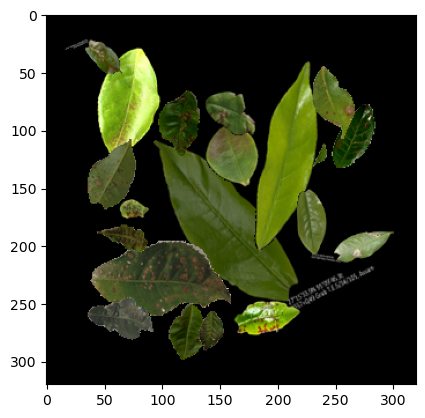

In [169]:
lib = load_leaf_library(leaf_library)
canvas, anns = create_synthetic_image(lib, class_probs)
plt.imshow(canvas)
plt.show()

In [170]:
print(set(item["class_id"] for item in leaf_library))

{0, 1, 2, 3, 4, 5, 6, 7}


In [171]:
library = load_leaf_library(leaf_library) 
images, annotations = generate_dataset(library, num_images=SAMPLE, class_probs=class_probs, use_rle=True)

Loaded valid objects: 10276


TypeError: 'float' object cannot be interpreted as an integer

In [ ]:
coco_output = {
    "images": images,
    "annotations": annotations,
    "categories": [{"id": i, "name": CLASS_NAMES[i]} for i in range(len(UNIFIED_CLASSES))]
}

with open(OUTPUT_DIR / "annotations.json", "w") as f:
    json.dump(coco_output, f)

print(f"Đã sinh {len(images)} ảnh, {len(annotations)} annotations.")
print(f"Dữ liệu tại: {OUTPUT_DIR}")

Đã sinh 100 ảnh, 2534 annotations.
Dữ liệu tại: coco_leaf


<!-- doc:auto -->
## 8. Trực quan hóa & thống kê dataset COCO

Giải mã segmentation (RLE/polygon) ra mask, vẽ overlay theo màu từng lớp và in thống kê số lượng object mỗi lớp để kiểm tra cân bằng dữ liệu cuối cùng.

In [ ]:
CLASS_COLORS = {
    0: (0, 255, 0),       # healthy_leaf
    1: (255, 0, 0),       # brown_blight
    2: (255, 165, 0),     # red_spider_mite
    3: (255, 0, 255),     # red_rust
    4: (0, 255, 255),     # gray_blight
    5: (255, 255, 0),     # helopeltis
    6: (0, 128, 255),     # green_mirid_bug
    7: (128, 0, 255),     # tea_algal_leaf_spot
}

In [ ]:
def decode_segmentation(segmentation, height, width):
    """
    Decode COCO segmentation về binary mask.
    Hỗ trợ:
    - RLE
    - Polygon
    """

    if isinstance(segmentation, dict):

        if cocomask is None:
            raise ValueError("pycocotools chưa cài.")

        mask = cocomask.decode(segmentation)

        if len(mask.shape) == 3:
            mask = mask[:, :, 0]

        return mask.astype(np.uint8)

    mask = np.zeros((height, width), dtype=np.uint8)

    for poly in segmentation:

        pts = np.array(poly).reshape(-1, 2).astype(np.int32)

        if len(pts) >= 3:
            cv2.fillPoly(mask, [pts], 1)

    return mask


def visualize_coco_sample(
    coco_json,
    image_root,
    image_id=None,
    alpha=0.45,
    figsize=(10, 10),
    show_bbox=True,
    show_label=True
):
    """
    Hiển thị 1 sample COCO với:
    - colored masks
    - bbox
    - labels
    """

    images = coco_json["images"]
    annotations = coco_json["annotations"]

    # random image nếu không truyền
    if image_id is None:
        image_info = random.choice(images)
    else:
        image_info = next(img for img in images if img["id"] == image_id)

    img_path = Path(image_root) / image_info["file_name"]

    img_bgr = cv2.imread(str(img_path))

    if img_bgr is None:
        print(f"Không đọc được ảnh: {img_path}")
        return

    img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    h, w = img.shape[:2]

    overlay = img.copy()

    anns = [ann for ann in annotations if ann["image_id"] == image_info["id"]]

    print(f"\nImage ID: {image_info['id']}")
    print(f"Objects: {len(anns)}")

    for ann in anns:

        cat_id = ann["category_id"]
        class_name = CLASS_NAMES[cat_id]
        color = CLASS_COLORS.get(cat_id, (255, 255, 255))
        mask = decode_segmentation(
            ann["segmentation"],
            h,
            w
        )
        colored_mask = np.zeros_like(img)

        colored_mask[:, :, 0] = color[0]
        colored_mask[:, :, 1] = color[1]
        colored_mask[:, :, 2] = color[2]

        overlay = np.where(
            mask[..., None] > 0,
            (
                overlay * (1 - alpha)
                + colored_mask * alpha
            ).astype(np.uint8),
            overlay
        )
        if show_bbox:
            x, y, bw, bh = ann["bbox"]
            cv2.rectangle(
                overlay,
                (int(x), int(y)),
                (int(x + bw), int(y + bh)),
                color,
                2
            )
        if show_label:

            text = class_name

            cv2.putText(
                overlay,
                text,
                (int(x), int(y) - 5),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                color,
                2,
                cv2.LINE_AA
            )

    plt.figure(figsize=figsize)
    plt.imshow(overlay)
    plt.title(
        f"Image ID {image_info['id']} | {len(anns)} objects"
    )
    plt.axis("off")
    plt.show()


In [ ]:
def visualize_multiple_samples(
    coco_json,
    image_root,
    n_samples=6,
    alpha=0.45
):
    """
    Hiển thị nhiều sample random.
    """

    chosen = random.sample(
        coco_json["images"],
        k=min(n_samples, len(coco_json["images"]))
    )

    for img_info in chosen:

        visualize_coco_sample(
            coco_json=coco_json,
            image_root=image_root,
            image_id=img_info["id"],
            alpha=alpha
        )


In [ ]:
def dataset_statistics(coco_json):

    print("\n================ DATASET STATS ================")

    total_images = len(coco_json["images"])
    total_annotations = len(coco_json["annotations"])

    print(f"Images: {total_images}")
    print(f"Annotations: {total_annotations}")

    class_counter = defaultdict(int)

    for ann in coco_json["annotations"]:
        class_counter[ann["category_id"]] += 1

    print("\nPer-class object counts:")

    for cid in sorted(CLASS_NAMES.keys()):

        print(
            f"{CLASS_NAMES[cid]:25s}: "
            f"{class_counter[cid]}"
        )

    print("================================================")


dataset_statistics(coco_output)


================ DATASET STATS ================
Images: 100
Annotations: 2534

Per-class object counts:
healthy_leaf             : 398
brown_blight             : 390
red_spider_mite          : 361
red_rust                 : 317
gray_blight              : 268
helopeltis               : 262
green_mirid_bug          : 365
tea_algal_leaf_spot      : 173



Image ID: 72
Objects: 26


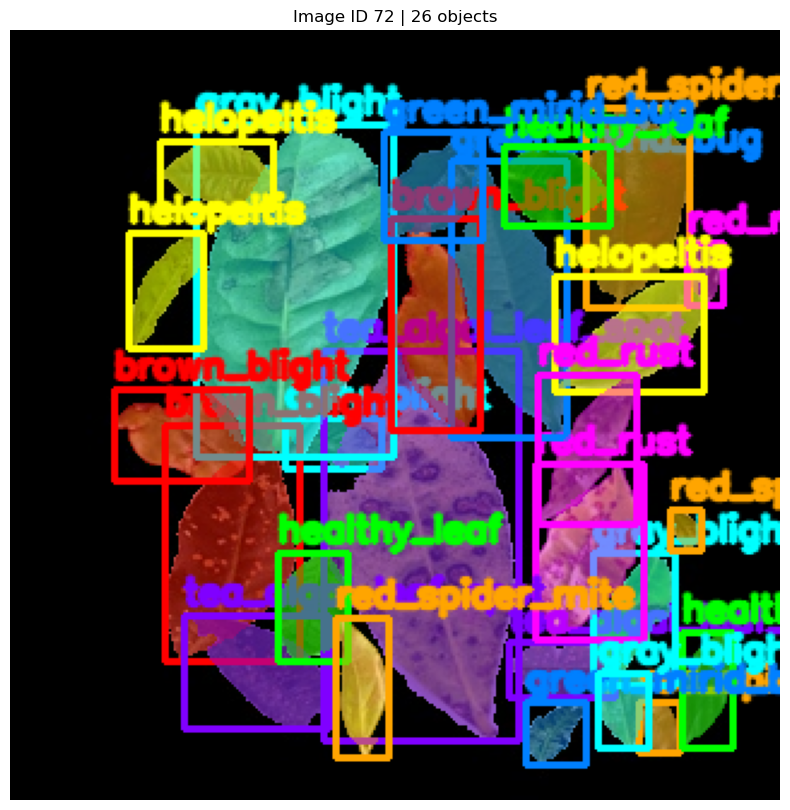


Image ID: 15
Objects: 30


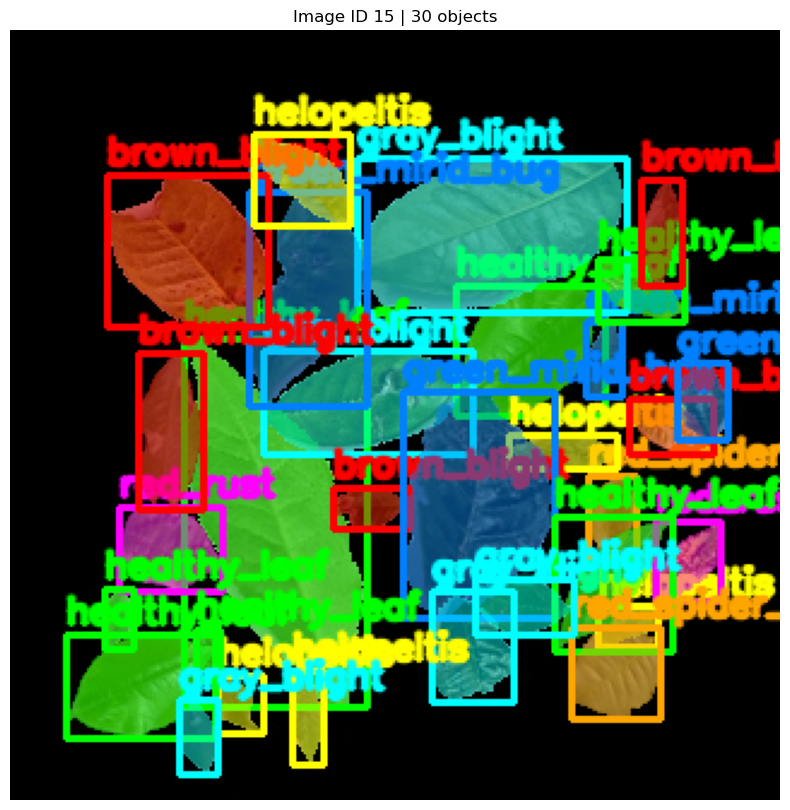


Image ID: 56
Objects: 24


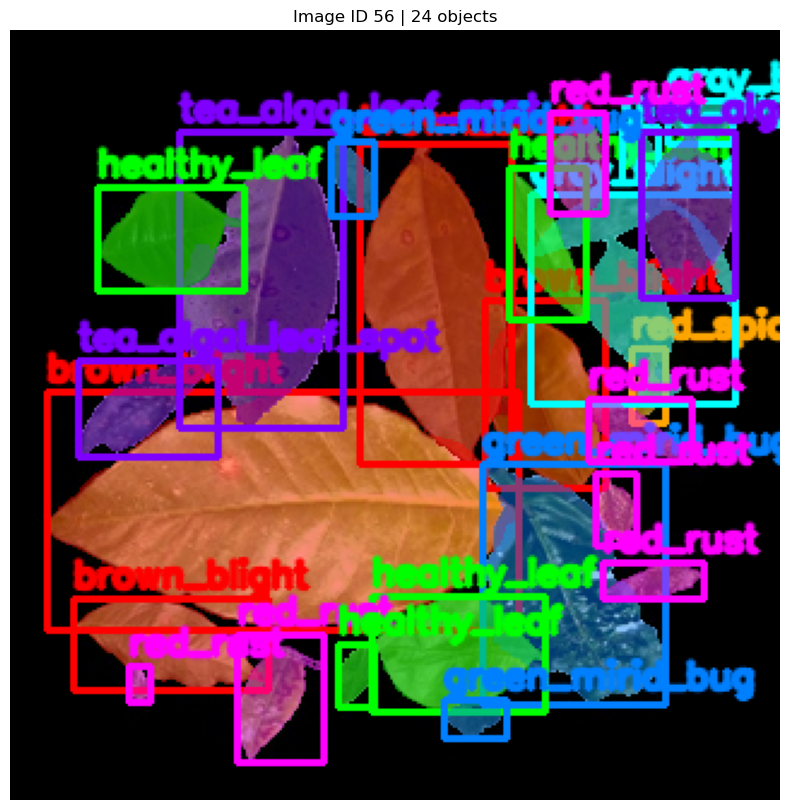


Image ID: 77
Objects: 26


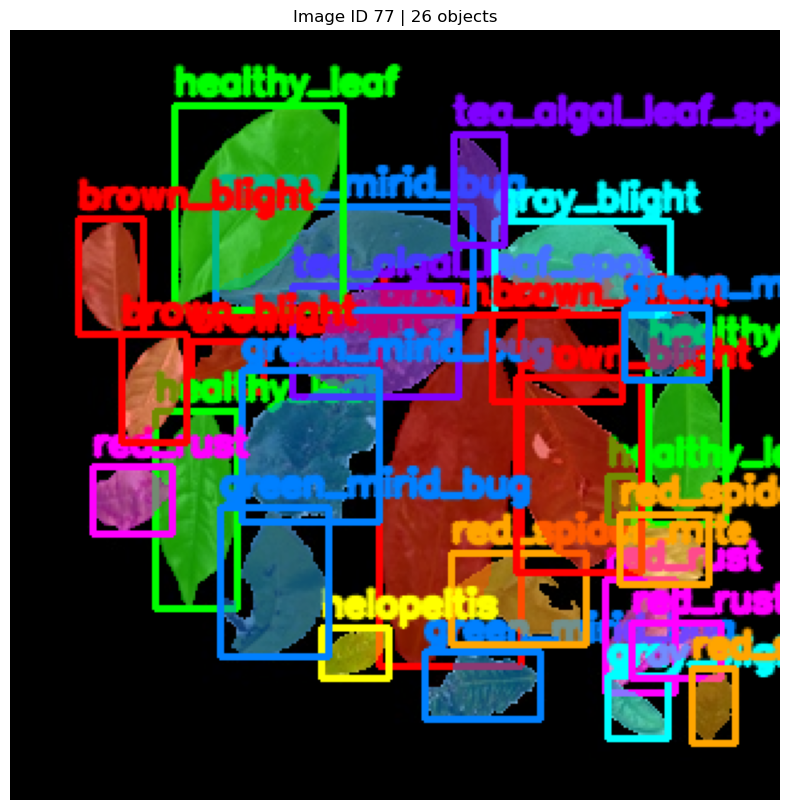


Image ID: 82
Objects: 29


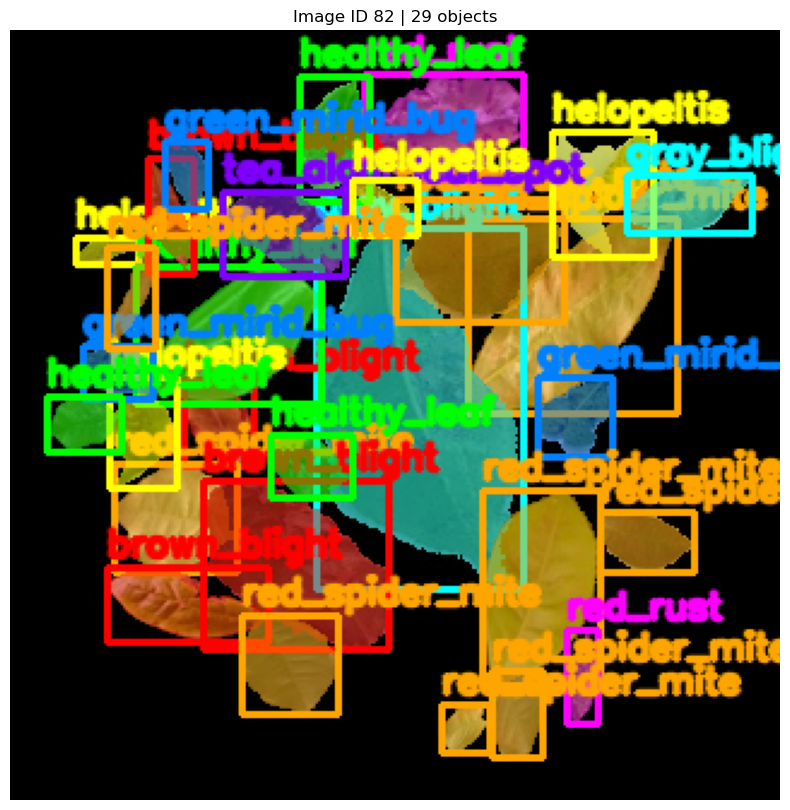

In [ ]:
visualize_multiple_samples(
    coco_json=coco_output,
    image_root=OUTPUT_DIR,
    n_samples=5
)